In [97]:
import pandas as pd
import numpy as np
import os
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler,LabelEncoder
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score,classification_report

In [2]:
os.getcwd()

'C:\\Users\\anuj_mahawar\\Desktop\\Python_Dirty_Hands\\Ineuron\\ML\\Logistic_Regression\\Task'

## Data Cleansing

In [3]:
def_path = 'C:\\Users\\anuj_mahawar\\Desktop\\Python_Dirty_Hands\\Ineuron\\ML\\Logistic_Regression\\Task\\'
data_path = def_path+'Dataset'
for root,dirs,files in os.walk(os.getcwd()):
    if len(dirs) > 0:
        for i in dirs:
            print('Folder:', i)
            for root,dirs,files in os.walk(data_path+'\\' +i):
                print(files)
                for j in files:
                    p = data_path+'\\' +i + '\\' + j
                    print(p)
                    with open (p,'r+') as f:
                        lines = f.read().split('# Columns: ')
                        #print(type(lines))
                        #print(lines[1])
                        if lines[1][-1] == ',':
                            f.seek(0)
                            # truncate the file
                            f.truncate()

                            # start writing lines except the first 4 line
                            f.writelines(lines[1][:-1])
                            
                        else:
                            f.seek(0)
                            # truncate the file
                            f.truncate()

                            # start writing lines except the first 4 line
                            f.writelines(lines[1])

                    df = pd.read_csv(p)
                    df['label'] = i
                    df.to_csv(p,index=False)

Folder: .ipynb_checkpoints
Folder: DataSet
Folder: bending1
['dataset1.csv', 'dataset2.csv', 'dataset3.csv', 'dataset4.csv', 'dataset5.csv', 'dataset6.csv', 'dataset7.csv']
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\bending1\dataset1.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\bending1\dataset2.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\bending1\dataset3.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\bending1\dataset4.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\bending1\dataset5.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\bending1\dataset6.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\bending1\dataset7.csv
Folder: bending2
['dat

C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\standing\dataset2.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\standing\dataset3.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\standing\dataset4.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\standing\dataset5.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\standing\dataset6.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\standing\dataset7.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\standing\dataset8.csv
C:\Users\anuj_mahawar\Desktop\Python_Dirty_Hands\Ineuron\ML\Logistic_Regression\Task\Dataset\standing\dataset9.csv
Folder: walking
['dataset1.csv', 'dataset10.csv', 'dataset11.csv', 'dataset12.cs

## Preparing the DataFrames

In [4]:
def_path = 'C:\\Users\\anuj_mahawar\\Desktop\\Python_Dirty_Hands\\Ineuron\\ML\\Logistic_Regression\\Task\\'
data_path = def_path+'Dataset'
final_df = pd.DataFrame()
for root,dirs,files in os.walk(data_path):
    if len(dirs) > 0:
        for i in dirs:
            l = []
            print('Folder:', i)
            for root,dirs,files in os.walk(data_path+'\\' +i):
                print(files)
                k = 0
                temp_df = pd.DataFrame()
                print('Before Append Length of Temp_Df is: ',len(temp_df))
                for j in files:
                    name = 'df_'+str(k)
                    ##print(name)
                    k += 1
                    p = data_path+'\\' +i + '\\' + j
                    ##print(p)
                    name = pd.read_csv(p)
                    ##print('Length of DF: ',len(name))
                    temp_df = temp_df.append(name)
                ##print('For Folder: ',i)
                print('After Append Length of temp_df: ',len(temp_df))
                print('---------------------------------------------')
                print('Before Append Length of Final_DF: ',len(final_df))
                final_df = final_df.append(temp_df)
                print('After Append Length of Final_DF: ',len(final_df))
                print('---------------------------------------------')

Folder: bending1
['dataset1.csv', 'dataset2.csv', 'dataset3.csv', 'dataset4.csv', 'dataset5.csv', 'dataset6.csv', 'dataset7.csv']
Before Append Length of Temp_Df is:  0
After Append Length of temp_df:  3360
---------------------------------------------
Before Append Length of Final_DF:  0
After Append Length of Final_DF:  3360
---------------------------------------------
Folder: bending2
['dataset1.csv', 'dataset2.csv', 'dataset3.csv', 'dataset4.csv', 'dataset5.csv', 'dataset6.csv']
Before Append Length of Temp_Df is:  0
After Append Length of temp_df:  2880
---------------------------------------------
Before Append Length of Final_DF:  3360
After Append Length of Final_DF:  6240
---------------------------------------------
Folder: cycling
['dataset1.csv', 'dataset10.csv', 'dataset11.csv', 'dataset12.csv', 'dataset13.csv', 'dataset14.csv', 'dataset15.csv', 'dataset2.csv', 'dataset3.csv', 'dataset4.csv', 'dataset5.csv', 'dataset6.csv', 'dataset7.csv', 'dataset8.csv', 'dataset9.csv']


In [98]:
print(final_df.head())

   time  avg_rss12  var_rss12  avg_rss13  var_rss13  avg_rss23  var_rss23  \
0     0      39.25       0.43      22.75       0.43      33.75        1.3   
1   250      39.25       0.43      23.00       0.00      33.00        0.0   
2   500      39.25       0.43      23.25       0.43      33.00        0.0   
3   750      39.50       0.50      23.00       0.71      33.00        0.0   
4  1000      39.50       0.50      24.00       0.00      33.00        0.0   

      label  
0  bending1  
1  bending1  
2  bending1  
3  bending1  
4  bending1  


In [99]:
print(final_df.tail())

       time  avg_rss12  var_rss12  avg_rss13  var_rss13  avg_rss23  var_rss23  \
475  118750      31.50       1.66      12.50       3.20      14.25       4.44   
476  119000      27.33       1.25      11.33       0.94      20.00       4.00   
477  119250      37.80       7.68      14.20       2.48      17.25       0.83   
478  119500      33.75       1.30      15.75       5.21      16.50       2.69   
479  119750      32.67       3.09      18.67       0.47      14.00       3.16   

       label  
475  walking  
476  walking  
477  walking  
478  walking  
479  walking  


In [100]:
type(final_df)

pandas.core.frame.DataFrame

In [101]:
print(final_df.shape)

(42239, 8)


In [102]:
## Removing the time column
df = final_df.drop(columns='time',axis=1)
df

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
0,39.25,0.43,22.75,0.43,33.75,1.30,bending1
1,39.25,0.43,23.00,0.00,33.00,0.00,bending1
2,39.25,0.43,23.25,0.43,33.00,0.00,bending1
3,39.50,0.50,23.00,0.71,33.00,0.00,bending1
4,39.50,0.50,24.00,0.00,33.00,0.00,bending1
...,...,...,...,...,...,...,...
475,31.50,1.66,12.50,3.20,14.25,4.44,walking
476,27.33,1.25,11.33,0.94,20.00,4.00,walking
477,37.80,7.68,14.20,2.48,17.25,0.83,walking
478,33.75,1.30,15.75,5.21,16.50,2.69,walking


In [104]:
df[df['label']=='bending2']

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
0,23.75,0.43,24.00,0.00,24.67,0.47,bending2
1,22.67,0.94,24.00,0.00,24.67,0.94,bending2
2,21.33,0.47,24.00,0.00,24.75,0.83,bending2
3,21.00,0.00,24.00,0.00,25.25,1.09,bending2
4,23.00,0.71,23.75,0.43,24.75,0.83,bending2
...,...,...,...,...,...,...,...
475,27.00,0.00,14.00,0.00,6.50,0.50,bending2
476,27.00,0.00,15.00,0.00,4.00,1.00,bending2
477,27.00,0.00,14.25,0.83,4.00,2.00,bending2
478,27.00,0.00,13.33,1.25,1.50,0.50,bending2


## Encode output label

In [105]:
encoder = LabelEncoder()

In [106]:
df[['label']] = encoder.fit_transform(df['label'])

In [107]:
df

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
0,39.25,0.43,22.75,0.43,33.75,1.30,0
1,39.25,0.43,23.00,0.00,33.00,0.00,0
2,39.25,0.43,23.25,0.43,33.00,0.00,0
3,39.50,0.50,23.00,0.71,33.00,0.00,0
4,39.50,0.50,24.00,0.00,33.00,0.00,0
...,...,...,...,...,...,...,...
475,31.50,1.66,12.50,3.20,14.25,4.44,6
476,27.33,1.25,11.33,0.94,20.00,4.00,6
477,37.80,7.68,14.20,2.48,17.25,0.83,6
478,33.75,1.30,15.75,5.21,16.50,2.69,6


In [108]:
encoder.classes_

array(['bending1', 'bending2', 'cycling', 'lying', 'sitting', 'standing',
       'walking'], dtype=object)

#### Profiling the Dataset

In [109]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Let's see how data is distributed for every column

C:\Users\anuj_mahawar\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\anuj_mahawar\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\anuj_mahawar\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `h

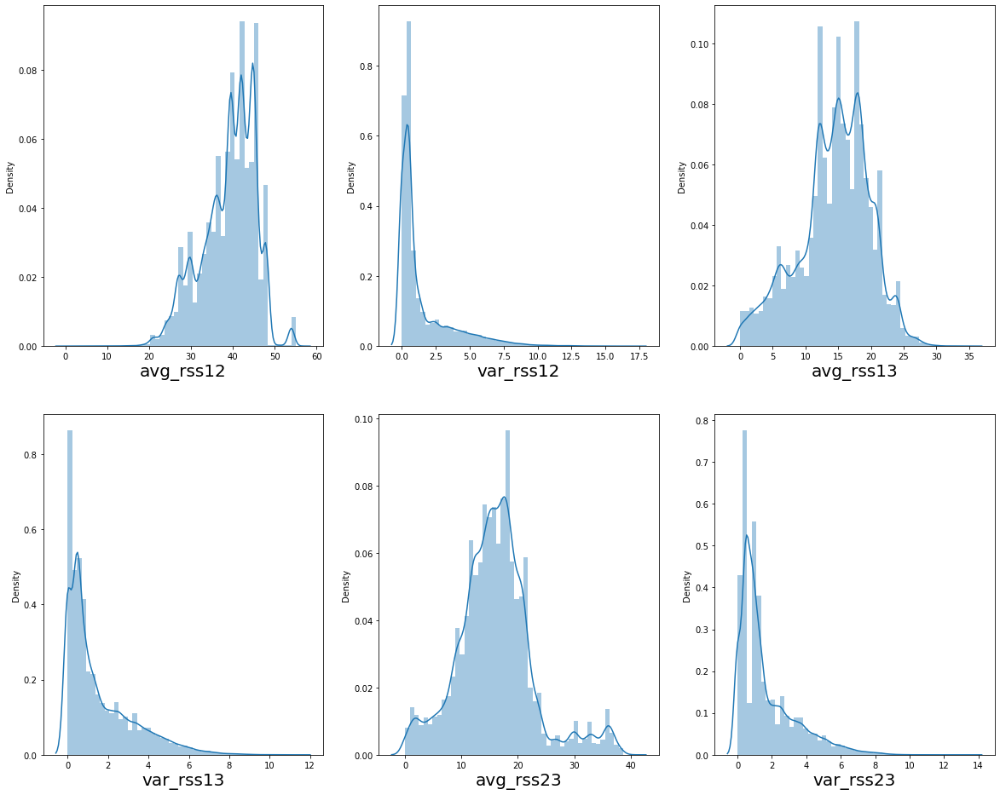

In [115]:

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in df:
    if plotnumber<=6 :     # as there are 7 columns in the data
        ax = plt.subplot(3,3,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=20)
        #plt.ylabel('Salary',fontsize=20)
    plotnumber+=1
plt.show()

## Not much Skewness is there in the Data

## Lets Check for the Nulls

In [116]:
df.isna().sum()

avg_rss12    480
var_rss12    480
avg_rss13    480
var_rss13    480
avg_rss23    480
var_rss23    480
label          0
dtype: int64

In [117]:
df[df.isna()]

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
475,NaN,NaN,NaN,NaN,NaN,NaN,NaN
476,NaN,NaN,NaN,NaN,NaN,NaN,NaN
477,NaN,NaN,NaN,NaN,NaN,NaN,NaN
478,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Removing the NaN from the DataFrame as only 480 rows have NaN out of 42.2k records i.e. ~1% of total records

In [127]:
new_df = df.dropna()
print(new_df.tail())

     avg_rss12  var_rss12  avg_rss13  var_rss13  avg_rss23  var_rss23  label
475      31.50       1.66      12.50       3.20      14.25       4.44      6
476      27.33       1.25      11.33       0.94      20.00       4.00      6
477      37.80       7.68      14.20       2.48      17.25       0.83      6
478      33.75       1.30      15.75       5.21      16.50       2.69      6
479      32.67       3.09      18.67       0.47      14.00       3.16      6


In [128]:
print(new_df.head())

   avg_rss12  var_rss12  avg_rss13  var_rss13  avg_rss23  var_rss23  label
0      39.25       0.43      22.75       0.43      33.75        1.3      0
1      39.25       0.43      23.00       0.00      33.00        0.0      0
2      39.25       0.43      23.25       0.43      33.00        0.0      0
3      39.50       0.50      23.00       0.71      33.00        0.0      0
4      39.50       0.50      24.00       0.00      33.00        0.0      0


In [129]:
new_df.isna().sum()

avg_rss12    0
var_rss12    0
avg_rss13    0
var_rss13    0
avg_rss23    0
var_rss23    0
label        0
dtype: int64

#### Columns starting with "var" means the variance according to the dataset description
#### They contain zero values. Since variance cannot be zero, it is replaced with mean or median

In [122]:
new_df["var_rss12"].replace(0, new_df["var_rss12"].mean(), inplace=True)
new_df["var_rss13"].replace(0, new_df["var_rss13"].mean(), inplace=True)
new_df["var_rss23"].replace(0, new_df["var_rss23"].mean(), inplace=True)

C:\Users\anuj_mahawar\Anaconda3\lib\site-packages\pandas\core\series.py:4509: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().replace(


In [131]:
new_df.shape

(41759, 7)

## First Approach

#### Lets Check for Outliers

<AxesSubplot:>

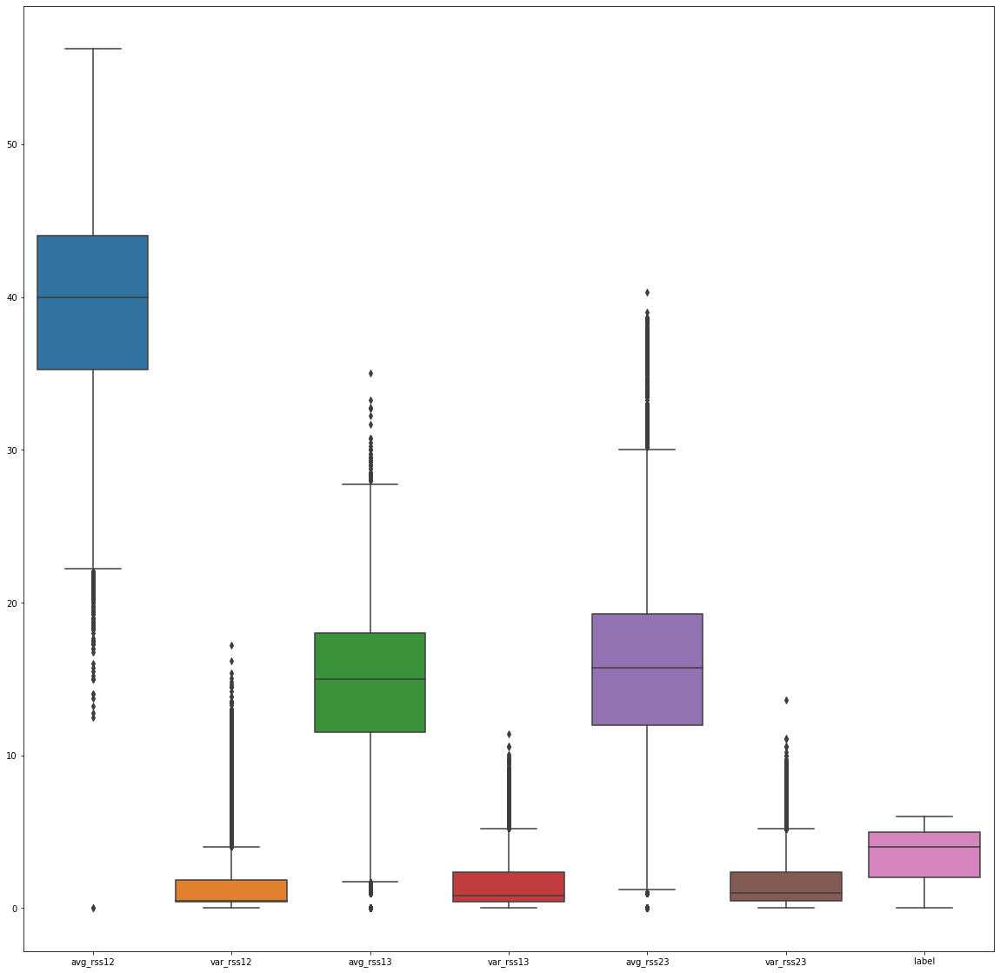

In [132]:
fig, ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=new_df, ax=ax)

## Almost all the columns have enough outliers present

In [159]:
q = new_df['var_rss12'].quantile(.95)
outliers_df = new_df[new_df['var_rss12']<q]

<AxesSubplot:>

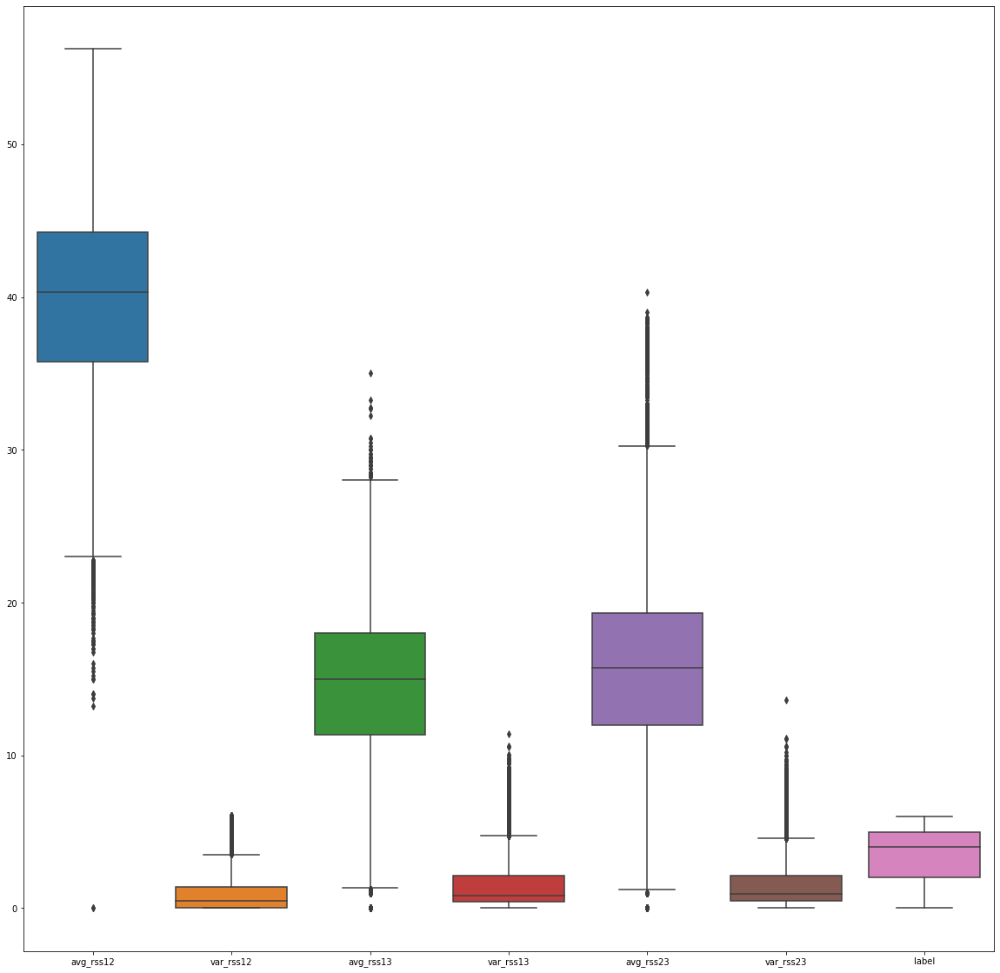

In [160]:
fig, ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=outliers_df,ax=ax)

In [161]:
outliers_df.shape

(39662, 7)

In [162]:
q = outliers_df['avg_rss23'].quantile(.95)
outliers_df = outliers_df[outliers_df['avg_rss23']<q]

<AxesSubplot:>

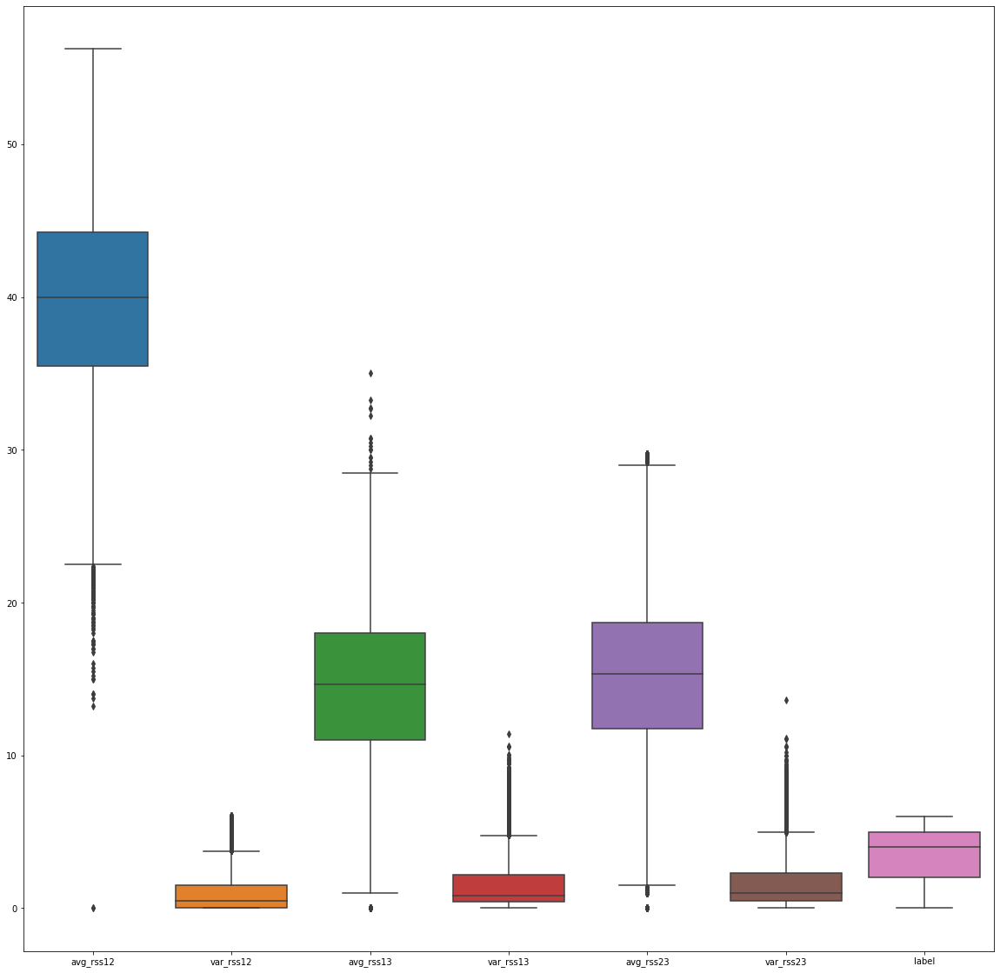

In [163]:
fig,ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=outliers_df,ax=ax)

In [164]:
outliers_df.shape

(37479, 7)

In [165]:
q = outliers_df['avg_rss12'].quantile(.02)
outliers_df = outliers_df[outliers_df['avg_rss12'] > q]

<AxesSubplot:>

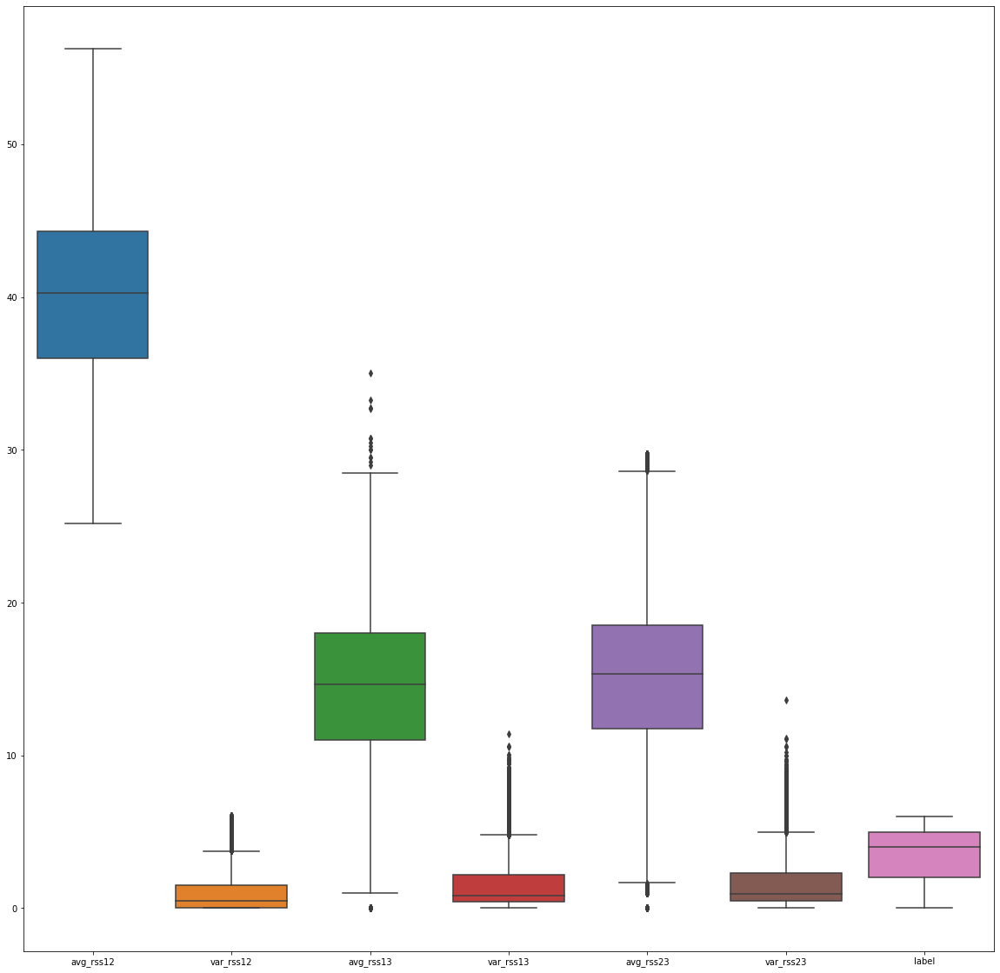

In [166]:
fig,ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=outliers_df,ax=ax)

In [167]:
outliers_df.shape

(36681, 7)

In [168]:
q = outliers_df['var_rss13'].quantile(.99)
outliers_df = outliers_df[outliers_df['var_rss13']<q]

<AxesSubplot:>

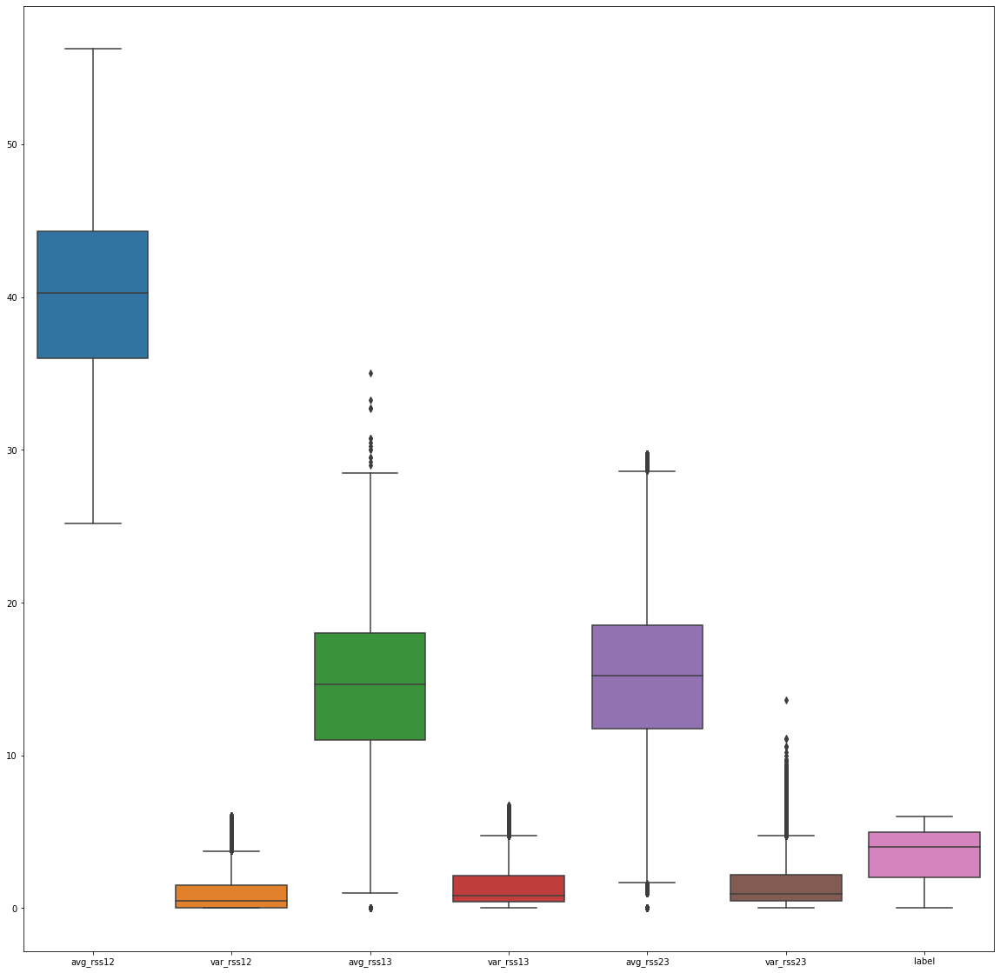

In [169]:
fig,ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=outliers_df,ax=ax)

In [170]:
outliers_df.shape

(36314, 7)

In [171]:
q = outliers_df['var_rss23'].quantile(.99)
outliers_df = outliers_df[outliers_df['var_rss23']<q]

<AxesSubplot:>

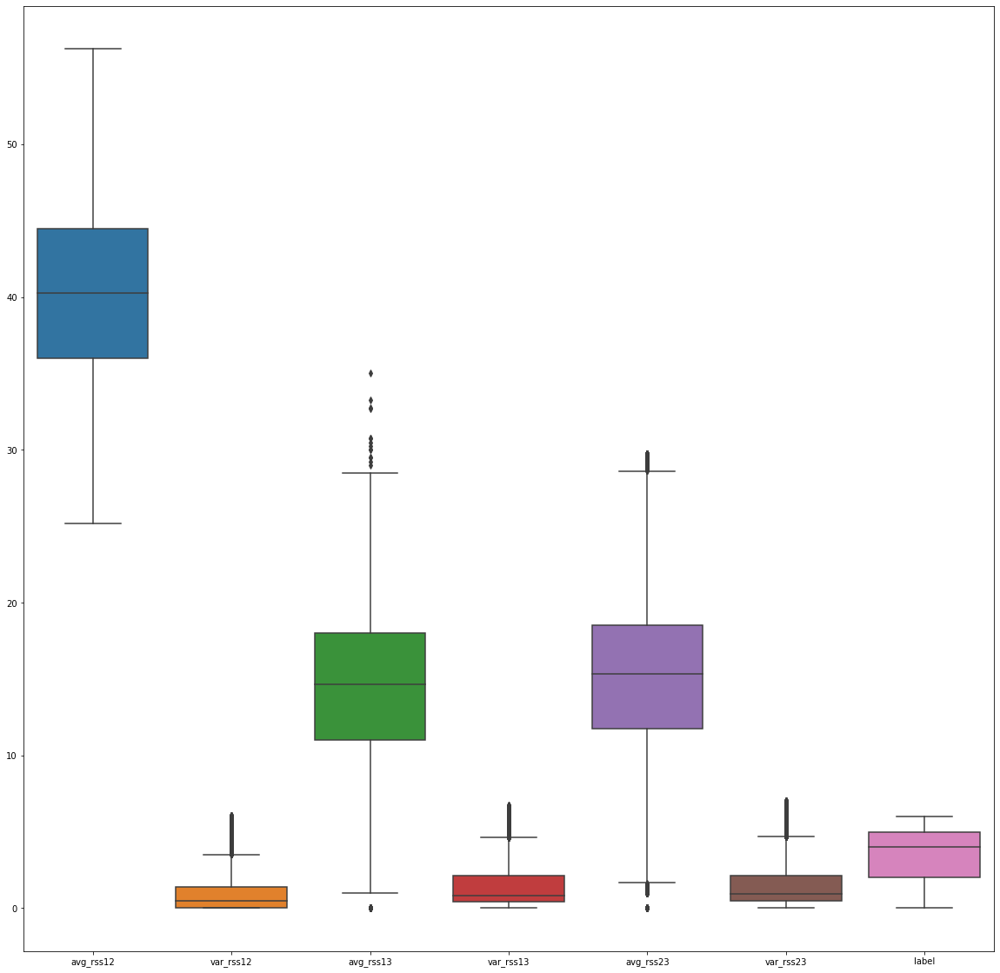

In [172]:
fig,ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=outliers_df,ax=ax)

#### Now there are less Outliers present in our Dataset

In [173]:
outliers_df.shape

(35949, 7)

In [174]:
outliers_df.head()

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,label
406,42.75,1.3,23.75,1.48,29.75,0.43,0
407,42.00,0.0,21.67,0.47,29.67,0.47,0
409,42.00,0.0,24.00,0.00,29.75,0.43,0
410,42.00,0.0,22.50,0.50,29.75,0.43,0
412,42.00,0.0,22.50,1.12,29.75,0.43,0


In [175]:
ProfileReport(outliers_df)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [70]:
ProfileReport(new_df)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Separating Labels

In [176]:
X = new_df.drop(columns=['label'])
y = new_df['label']

In [177]:
X

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,39.25,0.43,22.75,0.43,33.75,1.30
1,39.25,0.43,23.00,0.00,33.00,0.00
2,39.25,0.43,23.25,0.43,33.00,0.00
3,39.50,0.50,23.00,0.71,33.00,0.00
4,39.50,0.50,24.00,0.00,33.00,0.00
...,...,...,...,...,...,...
475,31.50,1.66,12.50,3.20,14.25,4.44
476,27.33,1.25,11.33,0.94,20.00,4.00
477,37.80,7.68,14.20,2.48,17.25,0.83
478,33.75,1.30,15.75,5.21,16.50,2.69


In [178]:
y

0      0
1      0
2      0
3      0
4      0
      ..
475    6
476    6
477    6
478    6
479    6
Name: label, Length: 41759, dtype: int32

In [179]:
scalar = StandardScaler()
X_scaled = scalar.fit_transform(X)

In [180]:
X_scaled

array([[ 0.03634496, -0.50743244,  1.55169975, -0.65882522,  2.62088431,
        -0.20166873],
       [ 0.03634496, -0.50743244,  1.59787257, -0.92034877,  2.51007261,
        -0.99307811],
       [ 0.03634496, -0.50743244,  1.64404539, -0.65882522,  2.51007261,
        -0.99307811],
       ...,
       [-0.19390848,  3.01988513, -0.02741073,  0.58797311,  0.18302692,
        -0.48779366],
       [-0.83703016, -0.08415433,  0.25886076,  2.24834355,  0.07221522,
         0.64453053],
       [-1.00852927,  0.78672821,  0.79815931, -0.63449744, -0.29715711,
         0.93065545]])

#### Splitting the DataSet

In [294]:
x_train,x_test,y_train,y_test = train_test_split(X_scaled,y, test_size= 0.2, random_state = 42)

#### Using saga solver

In [295]:
log_reg = LogisticRegression(verbose=1,solver='saga')
log_reg.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 15 epochs took 0 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


LogisticRegression(solver='saga', verbose=1)

#### Checking with the Data

In [296]:
log_reg.predict(x_train[[12]])

array([2])

In [297]:
y_train.iloc[12]

2

In [298]:
log_reg.predict_proba(x_train[[12]])

array([[6.08409252e-03, 3.38897812e-02, 6.07702228e-01, 5.33354798e-04,
        4.41000935e-02, 2.00814229e-02, 2.87609027e-01]])

In [299]:
log_reg.classes_

array([0, 1, 2, 3, 4, 5, 6])

In [300]:
log_reg.score(x_train,y_train)

0.6710868979555183

In [301]:
y_pred = log_reg.predict(x_test)

In [302]:
y_test

32     5
289    5
449    5
472    3
472    5
      ..
358    0
218    5
268    1
421    5
403    3
Name: label, Length: 8352, dtype: int32

In [303]:
y_pred

array([4, 5, 5, ..., 1, 3, 4])

In [304]:
confusion_matrix(y_test,y_pred)

array([[ 574,    0,   10,    0,  120,    3,    0],
       [  39,  322,   31,   39,   50,    1,    8],
       [   2,   15,  915,    1,  102,   26,  395],
       [   0,   46,    1, 1215,   20,  127,    5],
       [  55,   80,   41,  194,  715,  391,    8],
       [   4,    0,   24,  116,  356,  890,    4],
       [   0,   16,  440,    0,   10,    3,  938]], dtype=int64)

In [305]:
accuracy_score(y_test, y_pred)

0.6667863984674329

In [306]:
roc_auc_score(y_test, log_reg.predict_proba(x_test), multi_class='ovr')

0.9310332921051787

## Predicting with Test DataSet

In [307]:
log_reg.predict(x_test[[100]])

array([6])

In [308]:
y_test.iloc[100]

6

#### Plotting Confusion Matrix

In [309]:
# Confusion Matrix
conf_mat = classification_report(y_test,y_pred)
print(conf_mat)
print('------------------------')
print("Accuracy of the Model is:",accuracy_score(y_test,y_pred)*100,"%")

              precision    recall  f1-score   support

           0       0.85      0.81      0.83       707
           1       0.67      0.66      0.66       490
           2       0.63      0.63      0.63      1456
           3       0.78      0.86      0.82      1414
           4       0.52      0.48      0.50      1484
           5       0.62      0.64      0.63      1394
           6       0.69      0.67      0.68      1407

    accuracy                           0.67      8352
   macro avg       0.68      0.68      0.68      8352
weighted avg       0.66      0.67      0.66      8352

------------------------
Accuracy of the Model is: 66.6786398467433 %


#### Using Solver = 'sag'

In [310]:
log_reg_sag = LogisticRegression(verbose=1,solver='sag')
log_reg_sag.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 25 epochs took 1 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished


LogisticRegression(solver='sag', verbose=1)

In [311]:
log_reg_sag.predict(x_train[[12]])

array([2])

In [312]:
y_train.iloc[12]

2

In [313]:
y_pred = log_reg_sag.predict(x_test)

In [314]:
confusion_matrix(y_test,y_pred)

array([[ 574,    0,   10,    0,  120,    3,    0],
       [  39,  322,   31,   39,   50,    1,    8],
       [   2,   15,  914,    1,  102,   26,  396],
       [   0,   46,    1, 1215,   20,  127,    5],
       [  55,   80,   41,  194,  715,  391,    8],
       [   4,    0,   24,  116,  356,  890,    4],
       [   0,   16,  438,    0,   10,    3,  940]], dtype=int64)

In [315]:
accuracy_score(y_test, y_pred)*100

66.69061302681992

In [316]:
roc_auc_score(y_test, log_reg_sag.predict_proba(x_test), multi_class='ovr')

0.9310333097266026

#### Confusion Matrix for Sag Solver

In [317]:
# Confusion Matrix
conf_mat = classification_report(y_test,y_pred)
print(conf_mat)
print('------------------------')
print("Accuracy of the Model is:",accuracy_score(y_test,y_pred)*100)

              precision    recall  f1-score   support

           0       0.85      0.81      0.83       707
           1       0.67      0.66      0.66       490
           2       0.63      0.63      0.63      1456
           3       0.78      0.86      0.82      1414
           4       0.52      0.48      0.50      1484
           5       0.62      0.64      0.63      1394
           6       0.69      0.67      0.68      1407

    accuracy                           0.67      8352
   macro avg       0.68      0.68      0.68      8352
weighted avg       0.66      0.67      0.66      8352

------------------------
Accuracy of the Model is: 66.69061302681992


**Accuracy has improved Marginally**

#### Using Solver = 'lbfgs'

In [318]:
log_reg_lbfgs = LogisticRegression(verbose=1,solver='lbfgs')
log_reg_lbfgs.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.7s finished


LogisticRegression(verbose=1)

In [319]:
y_pred = log_reg_lbfgs.predict(x_test)

In [320]:
accuracy_score(y_test, y_pred)

0.6669061302681992

In [321]:
roc_auc_score(y_test, log_reg_lbfgs.predict_proba(x_test), multi_class='ovr')

0.9310332672680944

In [322]:
conf_mat = classification_report(y_test,y_predict)
print(conf_mat)
print("Accuracy of the Model is:",accuracy_score(y_test,y_pred)*100)

              precision    recall  f1-score   support

           0       0.07      0.07      0.07       707
           1       0.05      0.05      0.05       490
           2       0.16      0.15      0.16      1456
           3       0.17      0.22      0.19      1414
           4       0.18      0.11      0.14      1484
           5       0.16      0.20      0.18      1394
           6       0.16      0.17      0.16      1407

    accuracy                           0.15      8352
   macro avg       0.14      0.14      0.14      8352
weighted avg       0.15      0.15      0.15      8352

Accuracy of the Model is: 66.69061302681992


#### Using solver='newton-cg'

In [323]:
log_reg_newton = LogisticRegression(verbose=1,solver='newton-cg',multi_class='ovr')
log_reg_newton.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.8s finished


LogisticRegression(multi_class='ovr', solver='newton-cg', verbose=1)

In [324]:
y_predict = log_reg_newton.predict(x_test)

In [325]:
accuracy_score(y_test, y_pred)

0.6669061302681992

In [326]:
roc_auc_score(y_test, log_reg_lbfgs.predict_proba(x_test), multi_class='ovr')

0.9310332672680944

In [327]:
conf_mat = classification_report(y_test,y_predict)
print(conf_mat)
print("Accuracy of the Model is:",accuracy_score(y_test,y_pred)*100,"%")

              precision    recall  f1-score   support

           0       0.82      0.83      0.83       707
           1       0.67      0.68      0.67       490
           2       0.64      0.56      0.60      1456
           3       0.72      0.89      0.80      1414
           4       0.51      0.28      0.36      1484
           5       0.55      0.71      0.62      1394
           6       0.66      0.72      0.69      1407

    accuracy                           0.65      8352
   macro avg       0.65      0.67      0.65      8352
weighted avg       0.64      0.65      0.63      8352

Accuracy of the Model is: 66.69061302681992 %


## Conclusion : In this case, sag solver have the better accuracy and better roc_auc characteristics!!

In [396]:
import pickle
# Writing different model files to file
with open( 'modelForPrediction.sav', 'wb') as f:
    pickle.dump(log_reg_sag,f)
    
with open('sandardScalar.sav', 'wb') as f:
    pickle.dump(scalar,f)

## Second Approach

In [331]:
df.isna().sum()

avg_rss12    480
var_rss12    480
avg_rss13    480
var_rss13    480
avg_rss23    480
var_rss23    480
label          0
dtype: int64

In [334]:
df["var_rss12"].replace(np.nan, df["var_rss12"].mean(), inplace=True)
df["var_rss13"].replace(np.nan, df["var_rss13"].mean(), inplace=True)
df["var_rss23"].replace(np.nan, df["var_rss23"].mean(), inplace=True)
df["avg_rss12"].replace(np.nan, df["avg_rss12"].mean(), inplace=True)
df["avg_rss23"].replace(np.nan, df["avg_rss23"].mean(), inplace=True)
df["avg_rss13"].replace(np.nan, df["avg_rss13"].mean(), inplace=True)

In [335]:
df.isna().sum()

avg_rss12    0
var_rss12    0
avg_rss13    0
var_rss13    0
avg_rss23    0
var_rss23    0
label        0
dtype: int64

In [336]:
df.shape

(42239, 7)

#### Checking for OUtliers

<AxesSubplot:>

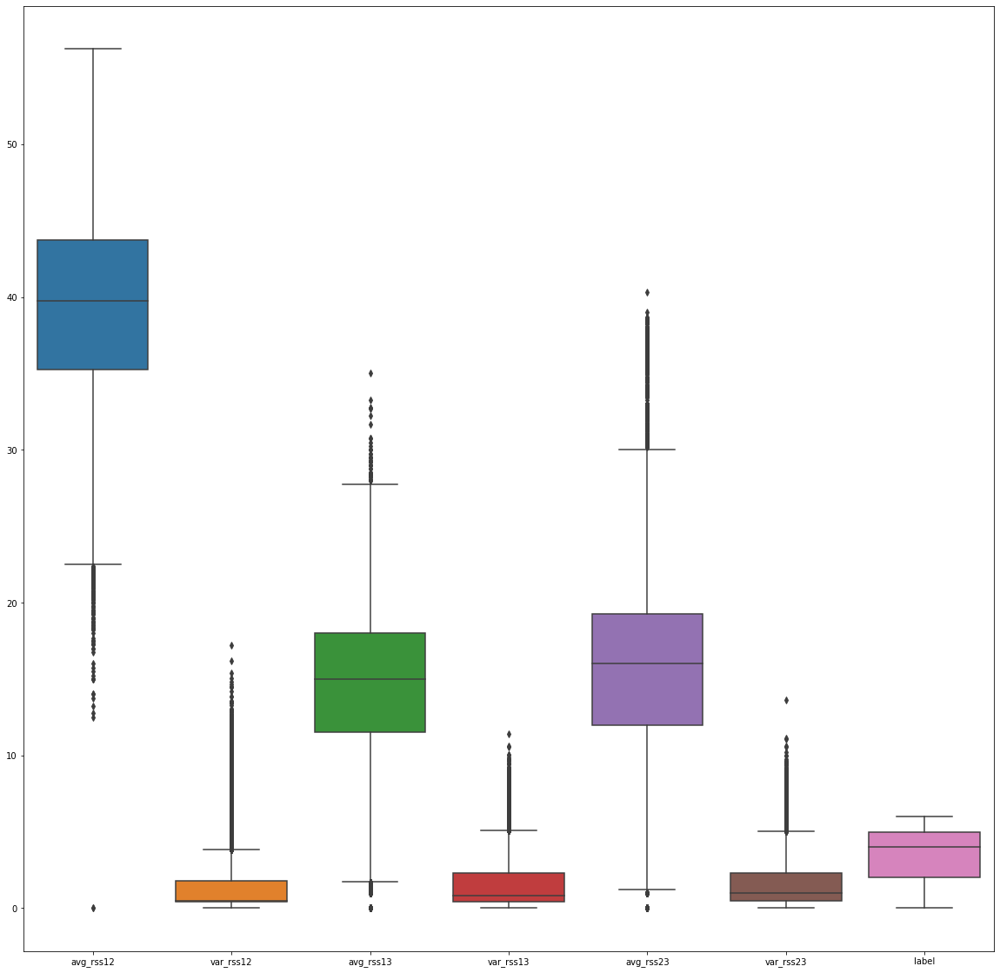

In [346]:
fig, ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df, ax=ax)

In [362]:
q = df['var_rss12'].quantile(.95)
df_new = df[df['var_rss12'] < q]

<AxesSubplot:>

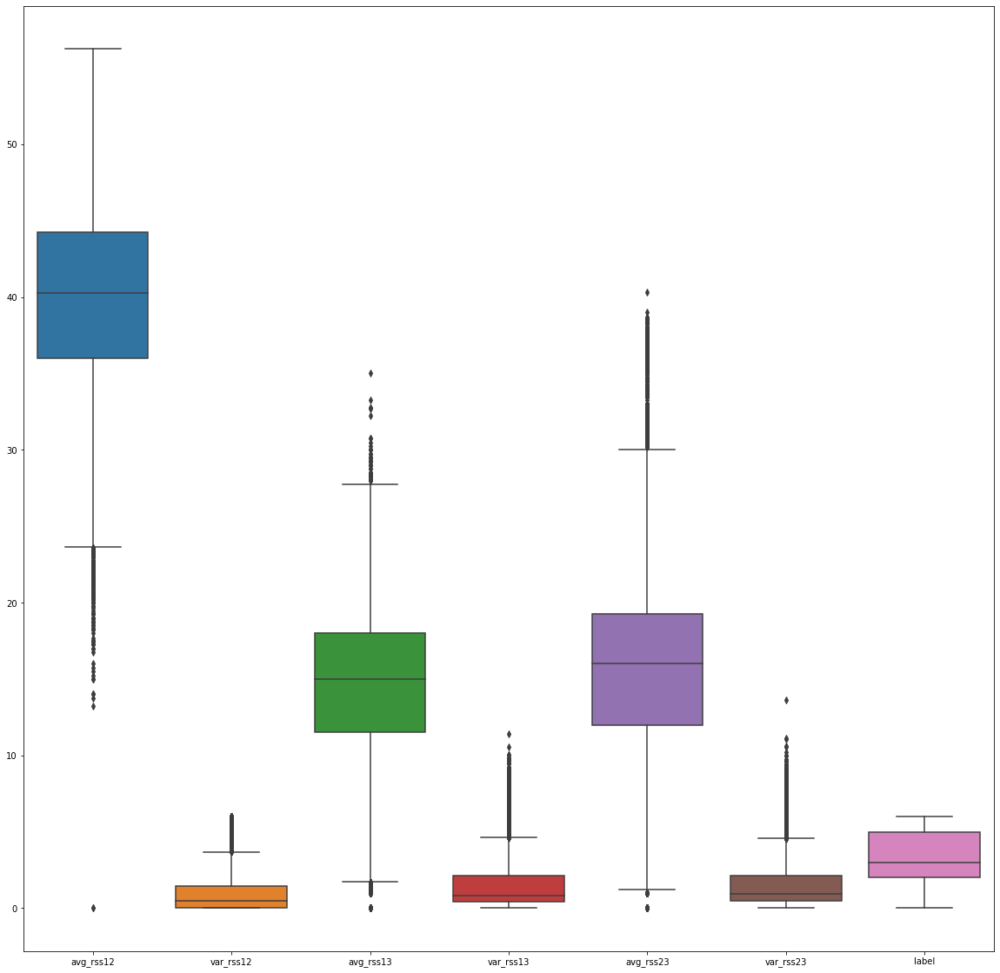

In [363]:
fig, ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df_new, ax=ax)

In [364]:
q = df_new['var_rss13'].quantile(.98)
df_new = df_new[df_new['var_rss13'] < q]

<AxesSubplot:>

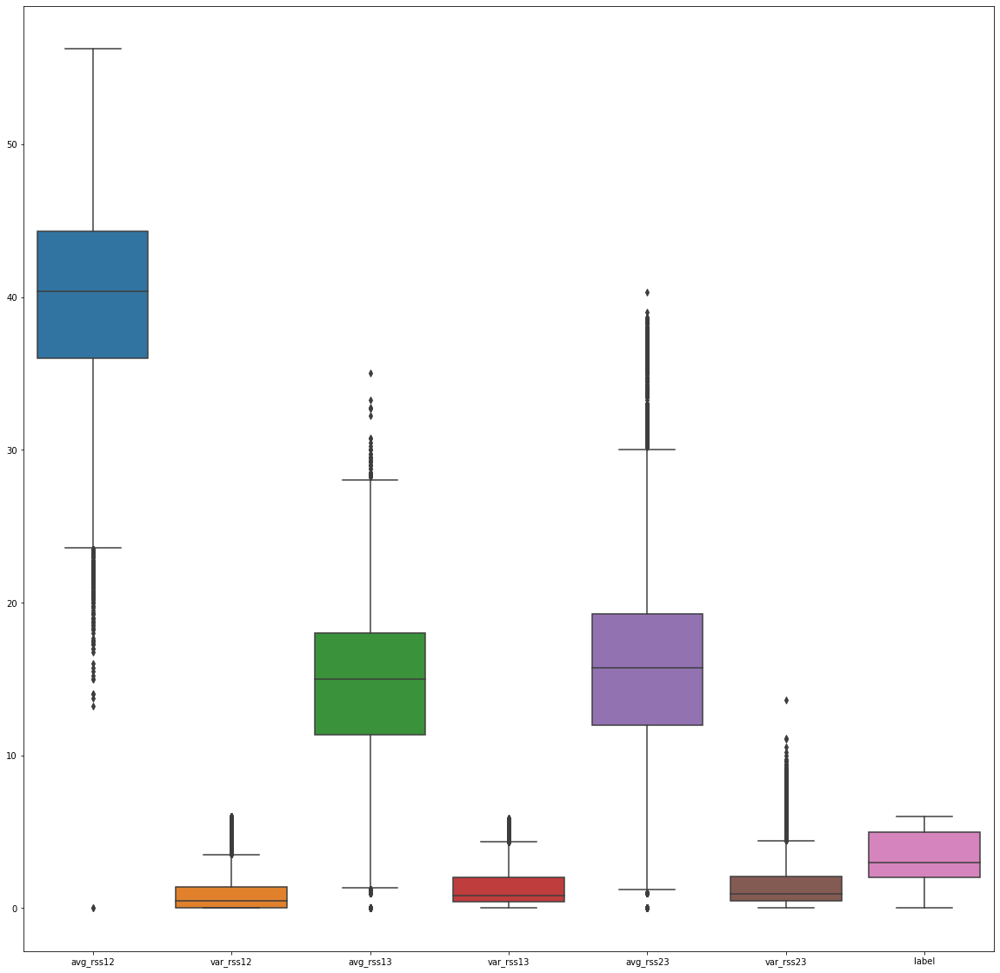

In [365]:
fig, ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df_new, ax=ax)

In [366]:
q = df_new['avg_rss12'].quantile(.02)
df_new = df_new[df_new['avg_rss12'] > q]

<AxesSubplot:>

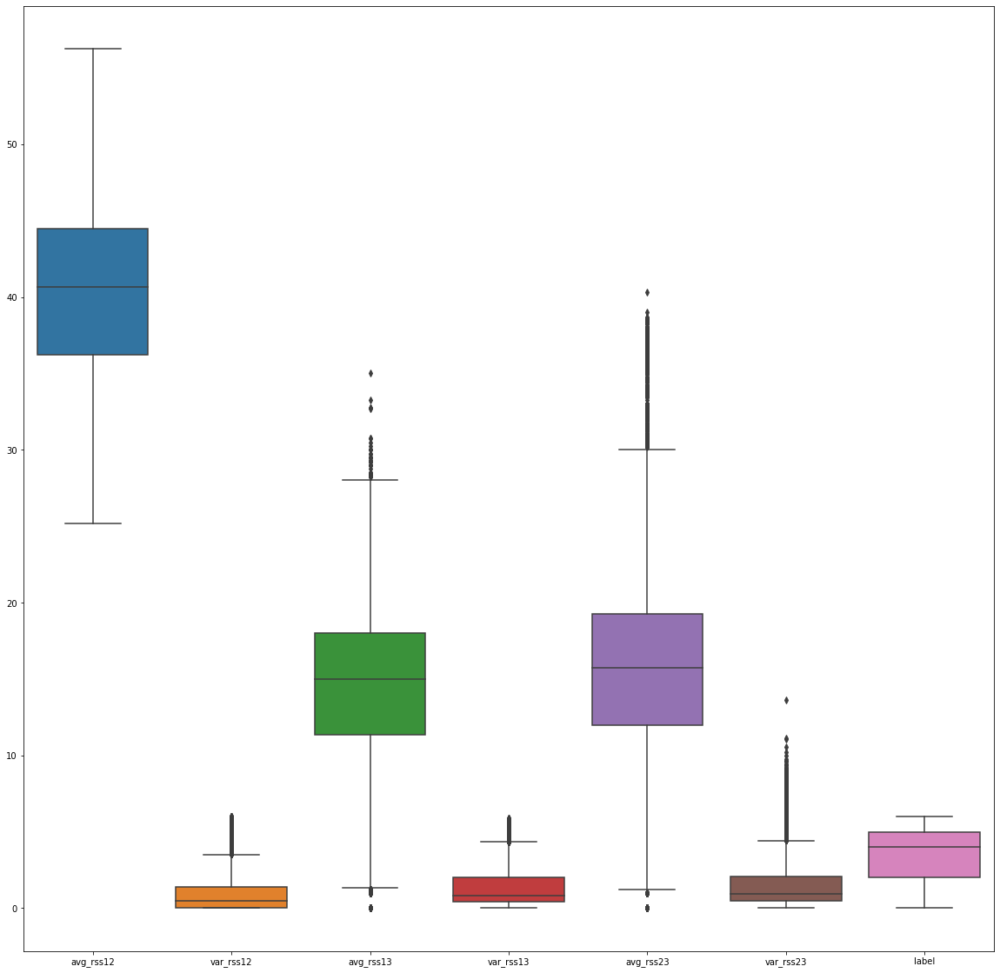

In [367]:
fig, ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df_new, ax=ax)

In [368]:
q = df_new['var_rss23'].quantile(.99)
df_new = df_new[df_new['var_rss23'] < q]

<AxesSubplot:>

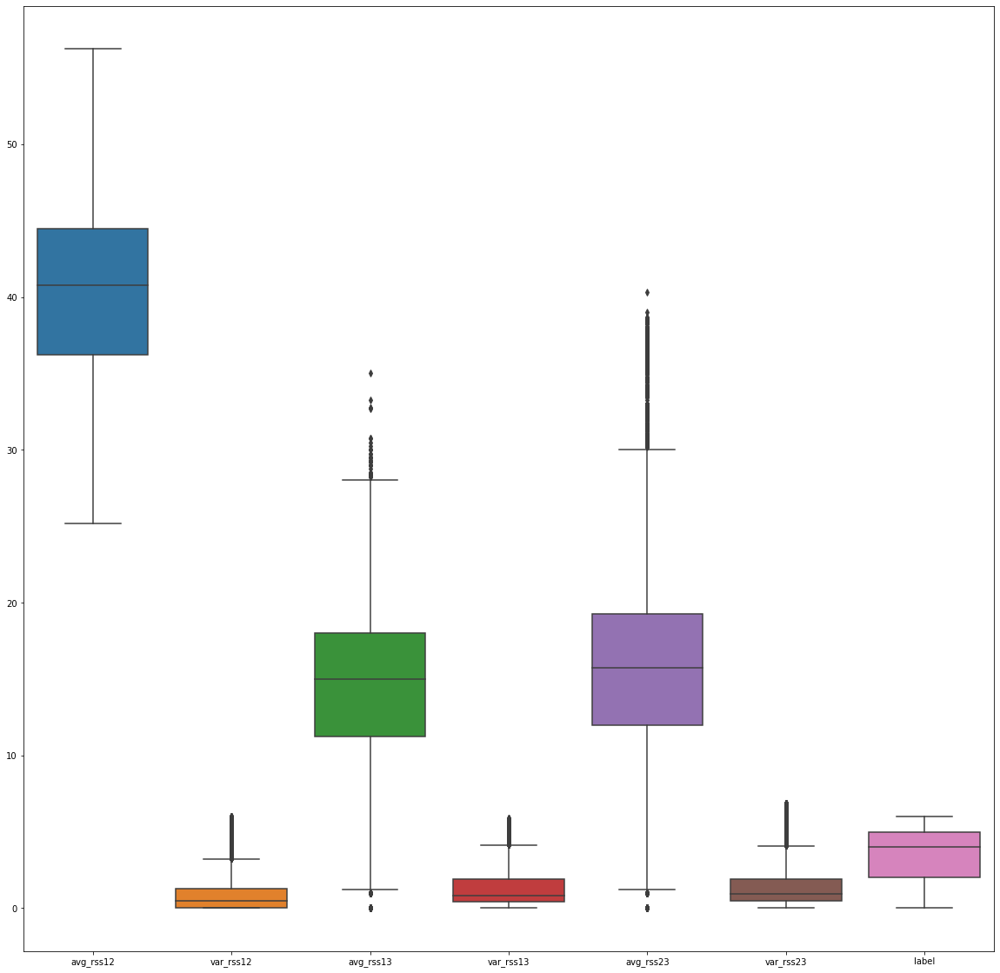

In [369]:
fig, ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df_new, ax=ax)

In [370]:
q = df_new['avg_rss23'].quantile(.95)
df_new = df_new[df_new['avg_rss23'] < q]

<AxesSubplot:>

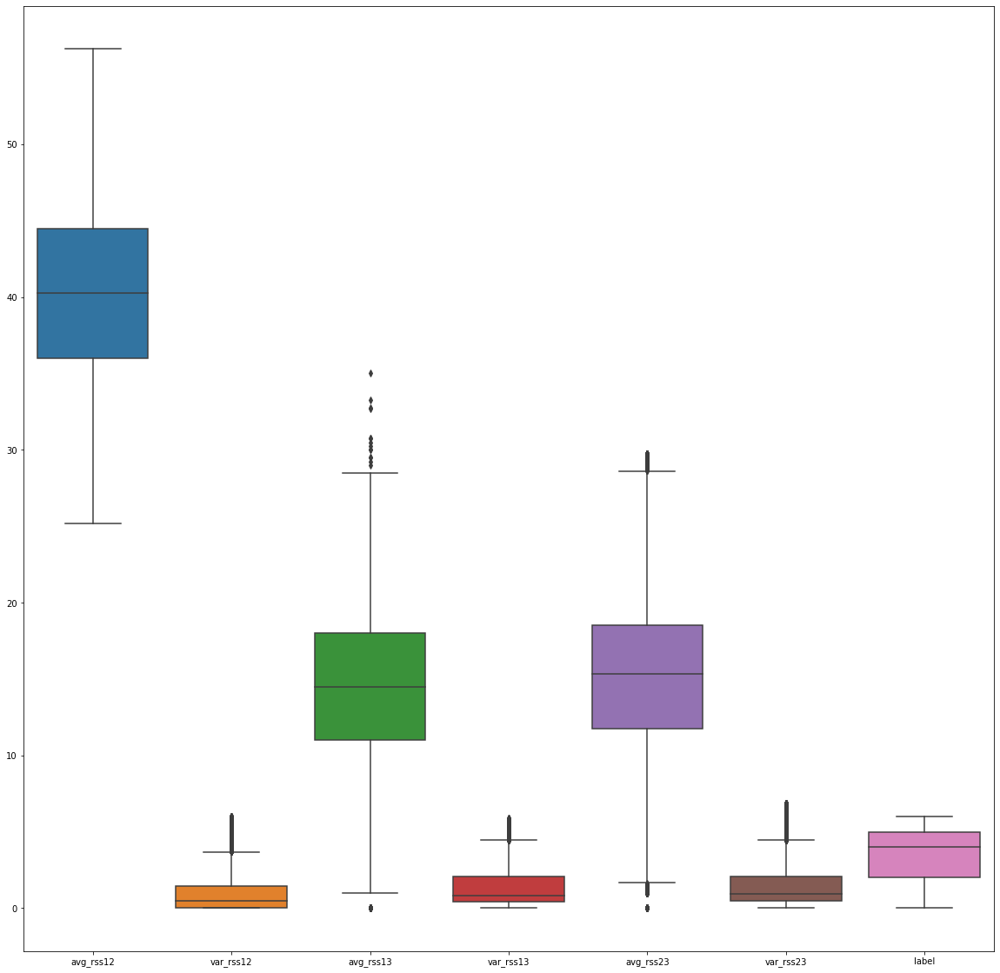

In [371]:
fig, ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df_new, ax=ax)

In [372]:
q = df_new['avg_rss13'].quantile(.99)
df_new = df_new[df_new['avg_rss13'] < q]

<AxesSubplot:>

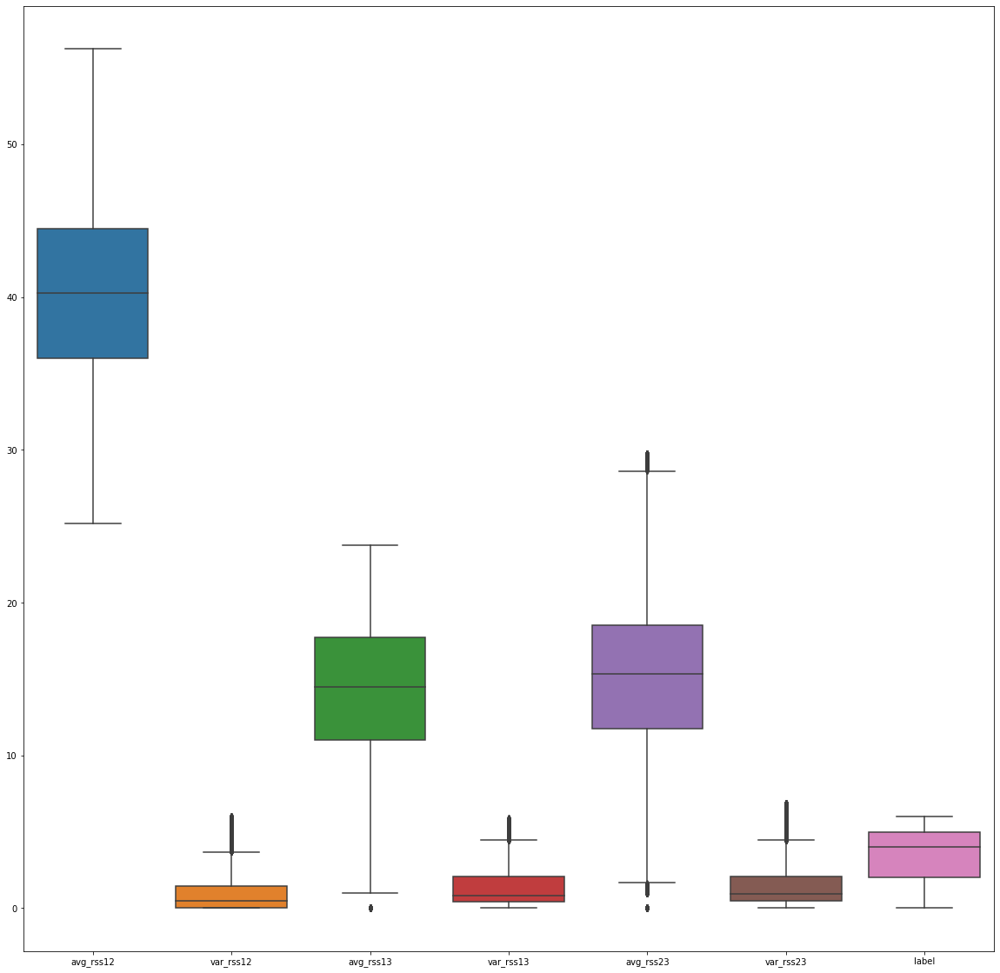

In [373]:
fig, ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df_new, ax=ax)

In [375]:
df_new.shape

(35445, 7)

#### Separating Labels

In [376]:
X = df_new.drop(columns=['label'])
y = df_new['label']

In [377]:
scalar = StandardScaler()
X_scaled = scalar.fit_transform(X)

#### Splitting the DataSet

In [378]:
x_train,x_test,y_train,y_test = train_test_split(X_scaled,y, test_size= 0.2, random_state = 42)

In [392]:
log_reg = LogisticRegression(verbose=1,solver='newton-cg',multi_class='ovr')
log_reg.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.6s finished


LogisticRegression(multi_class='ovr', solver='newton-cg', verbose=1)

In [393]:
y_pred = log_reg.predict(x_test)

In [394]:
accuracy_score(y_test,y_pred)

0.6170122725349132

In [395]:
roc_auc_score(y_test, log_reg.predict_proba(x_test),multi_class='ovr')

0.9117566721061892

# First Approach has better Accuracy and better ROC-AUC Curve